<center> <font color = #82318E size = 5 face = "微软雅黑"> Parameterization Scheme Version 22.22</font> </center>

<center> <font color = #82318E size = 4 face = "微软雅黑"> 1. 400 mg/L</font> </center>

<center> <font color = #82318E size = 3 face = "微软雅黑"> 1.1 Load Data </font> </center>

In [1]:
import numpy as np
import fortranformat as ff

In [2]:
def read_data_ssc_df50(name = 'A1.400.0025',tail = '129'):
    with open(file = './Data/fort({0}).{1}'.format(name, tail)) as f:
        temp_list = f.read().split('  ')
    print(len(temp_list))

    temp_data = list()
    for i in np.arange(1, len(temp_list)):
        reader_point = ff.FortranRecordReader(format = '(e14.5)')
        temp_data.append(reader_point.read(temp_list[i]))
    print(type(temp_data))
    print(len(temp_data))
    temp_matrix = np.array(temp_data, dtype = np.float64).reshape(2, -1)
    print(type(temp_matrix))
    print(temp_matrix.shape)
    print('-'*10)
    
    return temp_matrix


def read_data_bin(name = 'A1.400.0025',tail = '69'):
    with open(file = './Data/fort({0}).{1}'.format(name, tail)) as f:
        temp_list = f.read().split('  ')
    print(len(temp_list))

    temp_data = list()
    for i in np.arange(1, len(temp_list)):
        reader_point = ff.FortranRecordReader(format = '(e14.5)')
        temp_data.append(reader_point.read(temp_list[i]))
    print(type(temp_data))
    print(len(temp_data))

    temp_matrix = np.array(temp_data, dtype = np.float64).reshape(100, -1)
    print(type(temp_matrix))
    print(temp_matrix.shape)
    print('-'*10)

    return temp_matrix

In [3]:
def medium_calculate(experiment_id = 0, time = 0):
    for i in np.arange(1, 100, 1):
        if np.sum(temp_combine_bin[experiment_id,0:i:1,time+1])/np.sum(temp_combine_bin[experiment_id,0:100:1,time+1])> 0.5:
            break
    b = np.sum(temp_combine_bin[experiment_id,0:i:1,time+1])/np.sum(temp_combine_bin[experiment_id,0:100:1,time+1])
    a = np.sum(temp_combine_bin[experiment_id,0:i-1:1,time+1])/np.sum(temp_combine_bin[experiment_id,0:100:1,time+1])
    temp = i - (b-0.5)/(b-a)
    return 2**(temp/9. +1)

def quantile_calculate(experiment_id = 0, time = 0, quantile = 0.5):
    begin_bin = 0
    for i in np.arange(begin_bin+1, 100, 1):
        if np.sum(temp_combine_bin[experiment_id,begin_bin:i:1,time+1])/np.sum(temp_combine_bin[experiment_id,begin_bin:100:1,time+1])> quantile:
            break    
    b = np.sum(temp_combine_bin[experiment_id,begin_bin:i:1,time+1])/np.sum(temp_combine_bin[experiment_id,begin_bin:100:1,time+1])
    a = np.sum(temp_combine_bin[experiment_id,begin_bin:i-1:1,time+1])/np.sum(temp_combine_bin[experiment_id,begin_bin:100:1,time+1])
    temp = i - (b-quantile)/(b-a) # from (i-temp)/(i-(i-1)) = (b-q)/(b-a)
    return 2**(temp/9. +1)

In [4]:
temp_combine = np.zeros((3,2,600))
temp_combine[0,::,::] = read_data_ssc_df50('A1.400.0025', '129')
temp_combine[1,::,::] = read_data_ssc_df50('A1.400.0600', '129')
temp_combine[2,::,::] = read_data_ssc_df50('A1.400.1200', '129')

temp_combine_bin = np.zeros((3,100,602))
temp_combine_bin[0,::,::] = read_data_bin('A1.400.0025', '69')
temp_combine_bin[1,::,::] = read_data_bin('A1.400.0600', '69')
temp_combine_bin[2,::,::] = read_data_bin('A1.400.1200', '69')

1201
<class 'list'>
1200
<class 'numpy.ndarray'>
(2, 600)
----------
1201
<class 'list'>
1200
<class 'numpy.ndarray'>
(2, 600)
----------
1201
<class 'list'>
1200
<class 'numpy.ndarray'>
(2, 600)
----------
60201
<class 'list'>
60200
<class 'numpy.ndarray'>
(100, 602)
----------
60201
<class 'list'>
60200
<class 'numpy.ndarray'>
(100, 602)
----------
60201
<class 'list'>
60200
<class 'numpy.ndarray'>
(100, 602)
----------


<center> <font color = #82318E size = 3 face = "微软雅黑"> 1.2 Draw </font> </center>

In [5]:
import os
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

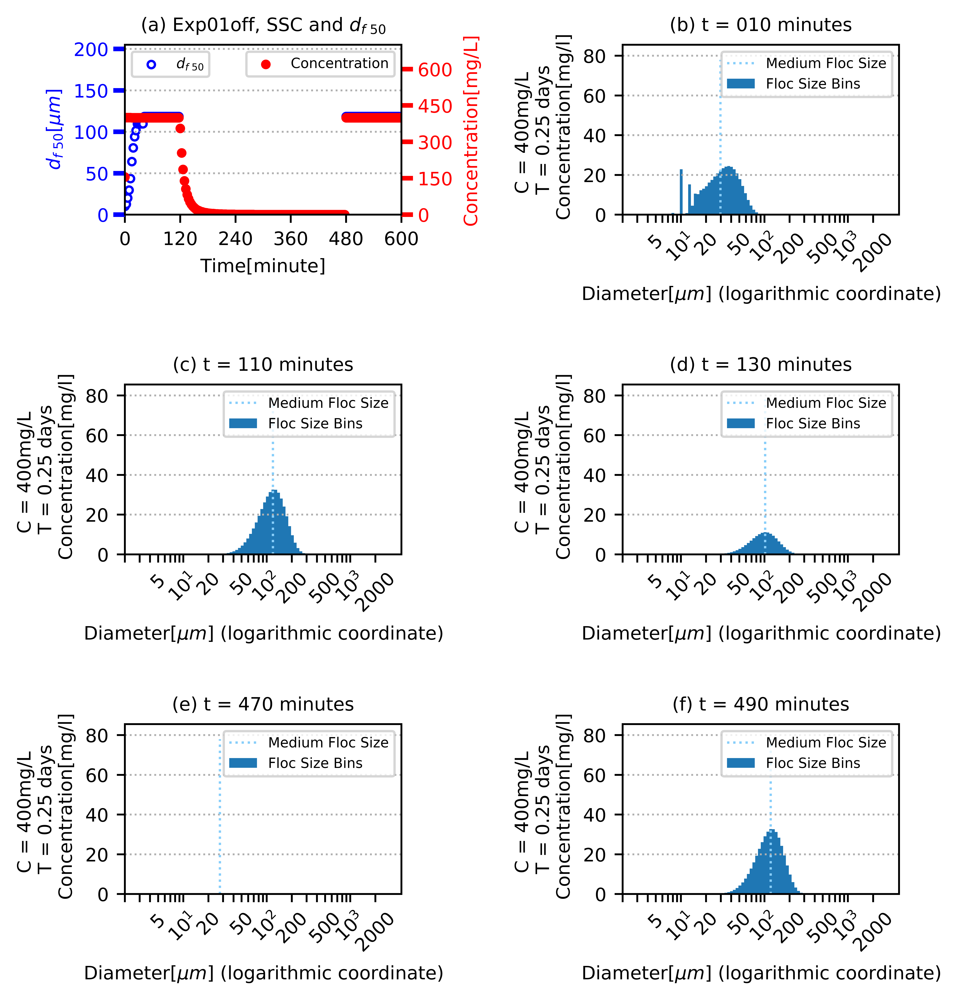

In [6]:
fig = plt.figure(dpi = 1080, figsize = (4*0.75*2, 3*0.75*3))
plt.subplots_adjust(wspace = 0.8, hspace = 1.0)

gs = GridSpec(3, 2)
ax=list()
    
ax.append(fig.add_subplot(gs[0, 0]))
ax.append(fig.add_subplot(gs[0, 1]))
ax.append(fig.add_subplot(gs[1, 0]))
ax.append(fig.add_subplot(gs[1, 1]))
ax.append(fig.add_subplot(gs[2, 0]))
ax.append(fig.add_subplot(gs[2, 1]))

ax_double = ax[0].twinx()

skip = 3
text_size = 8
legend_size = 6
experiment_id = 0
ax[0].scatter(np.arange(0, 120, skip), 2*temp_combine[experiment_id, 1, 0:120:skip], 
              edgecolors = 'blue', marker = 'o', color = 'white', s = 10, label = '$d_{f\ 50}$')
ax[0].scatter(np.arange(480, temp_combine.shape[2], skip), 2*temp_combine[experiment_id, 1, 480::skip], 
              edgecolors = 'blue', marker = 'o', color = 'white', s = 10)
ax[0].grid(b = True, axis = 'y', linestyle = ':')
ax[0].legend(loc = 'upper left', fontsize = legend_size)

ax[0].set_xlabel('Time[minute]', fontsize = text_size)
ax[0].set_ylim(-0, 205)
ax[0].set_yticks([0, 50, 100, 150, 200])
ax[0].set_ylabel('$d_{f\ 50}[\mu m]$', color = 'blue', fontsize = text_size)

ax_double.scatter(np.arange(0, temp_combine.shape[2], skip), temp_combine[experiment_id, 0, ::skip], 
                  color = 'red', marker = 'o', s = 10, label = 'Concentration')
ax_double.legend(loc = 'upper right', fontsize = legend_size)

ax_double.set_title('(a) Exp01off, SSC and $d_{f\ 50}$', fontsize = text_size)
ax_double.set_xlim(-0, 600)
ax_double.set_xticks([0, 120, 240, 360, 480, 600])
ax_double.set_xticklabels(['0', '120', '240', '360', '480', '600'])
ax_double.set_ylim(-0, 700)
ax_double.set_yticks([0, 150, 300, 450, 600])
ax_double.set_yticklabels(['0', '150', '300', '450', '600'])
ax_double.set_ylabel('Concentration[mg/L]', color = 'red', fontsize = text_size)

for label in ax[0].xaxis.get_ticklabels():
    label.set_fontsize(text_size)

for label in ax[0].yaxis.get_ticklabels():
    label.set_color('blue')
    label.set_fontsize(text_size)
    
for label in ax_double.yaxis.get_ticklabels():
    label.set_color('red')
    label.set_fontsize(text_size)

for line in ax[0].yaxis.get_ticklines():
    line.set_color('blue') 
    line.set_markersize(5)
    line.set_markeredgewidth(2)
    
for line in ax_double.yaxis.get_ticklines():
    line.set_color('red')
    line.set_markersize(5)
    line.set_markeredgewidth(2)
    
    
def log_spectrum(pic, time, days, label, y_interval_min = -0.0 , y_interval_max = 85.5):

    experiment_id = 0
    Y = temp_combine_bin[experiment_id, 0:100:, time+1]*1.0e3
    Z = np.arange(0, 80, 2)

    pic.bar(np.arange(Y.shape[0]), Y, label = 'Floc Size Bins', width = 1.0)
    pic.grid(b = True, axis = 'y', linestyle = ':')
        
    pic.set_title('{}'.format(label), fontsize = text_size)
    pic.set_xlabel('Diameter[$\mu m$] (logarithmic coordinate)', fontsize = text_size)
    
    pic.set_xlim(0, 90)
    temp_xlabel=np.concatenate((np.arange(2,10,1), np.arange(10,100,10),
                                np.arange(100,1000,100), np.array([1000, 2000])), axis=0)
    temp_xlabel = 9*(np.log(temp_xlabel)/np.log(2)-2)
    pic.set_xticks(temp_xlabel)
    pic.set_xticklabels(['','','','5','','','','','$10^1$',
                         '$20$','','','$50$','','','','','$10^2$',
                         '$200$','','','$500$','','','','','$10^3$',
                         '$2000$'], fontsize = text_size, rotation = 45)
    
    pic.set_ylim(y_interval_min, y_interval_max)
    pic.set_yticks([0, 20, 40, 60, 80])
    pic.set_yticklabels(['0', '20', '40', '60', '80'], fontsize = text_size)
    pic.set_ylabel('C = 400mg/L \n T = {} days \n Concentration[mg/l]'.format(days), fontsize = text_size)
    
    pic.plot(9*(np.log(temp_combine[experiment_id, 1, time-1]*2*np.ones(Z.size))/np.log(2)-2), Z, linewidth = 1.0,
             linestyle = ':', color = 'lightskyblue', label = 'Medium Floc Size') 
    
    pic.legend(loc = 'upper right', fontsize = legend_size)
    
    return 

log_spectrum(ax[1], 10, 0.25, '(b) t = 010 minutes')
log_spectrum(ax[2], 110, 0.25, '(c) t = 110 minutes')
log_spectrum(ax[3], 130, 0.25, '(d) t = 130 minutes')
log_spectrum(ax[4], 470, 0.25, '(e) t = 470 minutes')
log_spectrum(ax[5], 490, 0.25, '(f) t = 490 minutes')

plt.savefig('./Figure/A1.400.jpeg', format = 'jpeg', bbox_inches = 'tight')
plt.savefig('./Figure/A1.400.png', format = 'png', bbox_inches = 'tight')
plt.savefig('./Figure/A1.400.svg', format = 'svg', bbox_inches = 'tight')
plt.savefig('./Figure/A1.400.eps', format = 'eps', bbox_inches = 'tight')

plt.show()

<center> <font color = #82318E size = 4 face = "微软雅黑"> 2. Periodic Forcing </font> </center>

<center> <font color = #82318E size = 3 face = "微软雅黑"> 2.1 Load Data </font> </center>

In [7]:
temp_combine = np.zeros((4,2,300))
temp_combine[0,::,::] = read_data_ssc_df50('A2.10000.0000', '129')
temp_combine[1,::,::] = read_data_ssc_df50('A2.10000.0025', '129')
temp_combine[2,::,::] = read_data_ssc_df50('A2.10000.0600', '129')
temp_combine[3,::,::] = read_data_ssc_df50('A2.10000.1200', '129')

temp_combine_bin = np.zeros((4,100,302))
temp_combine_bin[0,::,::] = read_data_bin('A2.10000.0000', '69')
temp_combine_bin[1,::,::] = read_data_bin('A2.10000.0025', '69')
temp_combine_bin[2,::,::] = read_data_bin('A2.10000.0600', '69')
temp_combine_bin[3,::,::] = read_data_bin('A2.10000.1200', '69')

for i in np.arange(1, temp_combine.shape[2], 1):
    temp_combine[0,1,i] = medium_calculate(0,i)
    temp_combine[1,1,i] = medium_calculate(1,i)
    temp_combine[2,1,i] = medium_calculate(2,i)
    temp_combine[3,1,i] = medium_calculate(3,i)

601
<class 'list'>
600
<class 'numpy.ndarray'>
(2, 300)
----------
601
<class 'list'>
600
<class 'numpy.ndarray'>
(2, 300)
----------
601
<class 'list'>
600
<class 'numpy.ndarray'>
(2, 300)
----------
601
<class 'list'>
600
<class 'numpy.ndarray'>
(2, 300)
----------
30201
<class 'list'>
30200
<class 'numpy.ndarray'>
(100, 302)
----------
30201
<class 'list'>
30200
<class 'numpy.ndarray'>
(100, 302)
----------
30201
<class 'list'>
30200
<class 'numpy.ndarray'>
(100, 302)
----------
30201
<class 'list'>
30200
<class 'numpy.ndarray'>
(100, 302)
----------


<center> <font color = #82318E size = 3 face = "微软雅黑"> 2.2 Draw </font> </center>

In [8]:
text_size = 10

In [9]:
def parameterization_ssc_scatter(pic, experiment_id, title, Y1, Y2):
    skip = 2
    pic.scatter(np.arange(0, temp_combine.shape[2], skip), temp_combine[0, 0, ::skip], 
                      edgecolors = 'coral', marker = 'o', color = 'white', s = 10, label = 'Turn off, SSC')  
    pic.scatter(np.arange(0, temp_combine.shape[2], skip), temp_combine[experiment_id, 0, ::skip], 
                      edgecolors = 'red', marker = 'o', color = 'white', s = 10, label = 'Turn on, SSC')
    
    X = np.arange(0-5, temp_combine.shape[2]+5, 1)
    Y1 = Y1*np.ones(X.shape)
    Y2 = Y2*np.ones(X.shape)
    pic.fill_between(X, Y1, Y2, where = Y1<=Y2, facecolor = 'orange',
                     interpolate = True, alpha = 0.5, label = 'Final SSC Range')
    
    legend_size = 8
    
    pic.set_title('{}'.format(title), fontsize = text_size)
    pic.grid(b = True, axis = 'y', linestyle = ':')
    
    pic.set_xlim(0, 300)
    pic.set_xlabel('Time[minute]', fontsize = text_size)
    pic.set_xticks([0, 50, 100, 150, 200, 250, 300])
    pic.set_xticklabels(['0', '50', '100', '150', '200', '250', '300'])
    for label in pic.xaxis.get_ticklabels():
        label.set_fontsize(text_size)
        
    pic.set_ylim(-0, 1000)
    pic.set_ylabel('Concentration[mg/L]', fontsize = text_size)
    pic.set_yticks([0, 250, 500, 750, 1000])
    pic.set_yticklabels(['0', '250', '500', '750', '1000'])
    for label in pic.yaxis.get_ticklabels():
        label.set_fontsize(text_size)
        
    pic.legend(loc = 'lower right', fontsize = legend_size)
    
    return

In [10]:
def parameterization_df50_scatter(pic, experiment_id, title, Y1, Y2):
    skip = 2
    pic.scatter(np.arange(0, temp_combine.shape[2], skip), 2*temp_combine[0, 1, ::skip], 
                      edgecolors = 'lightblue', marker = 'o', color = 'white', s = 10, label = 'Turn off, $d_{f\ 50}$')  
    pic.scatter(np.arange(0, temp_combine.shape[2], skip), 2*temp_combine[experiment_id, 1, ::skip], 
                      edgecolors = 'blue', marker = 'o', color = 'white', s = 10, label = 'Turn on, $d_{f\ 50}$')
    
    X = np.arange(0-5, temp_combine.shape[2]+5, 1)
    Y1 = Y1*np.ones(X.shape)
    Y2 = Y2*np.ones(X.shape)
    pic.fill_between(X, Y1, Y2, where = Y1<=Y2, facecolor = 'lightskyblue',
                     interpolate = True, alpha = 0.5, label = 'Final $d_{f\ 50}$ Range')
    
    legend_size = 8
    
    pic.set_title('{}'.format(title), x = 1.0, fontsize = text_size)
    pic.grid(b = True, axis = 'y', linestyle = ':')
    
    pic.set_xlim(-0, 300)
    pic.set_xlabel('Time[minute]', fontsize = text_size)
    pic.set_xticks([0, 50, 100, 150, 200, 250, 300])
    pic.set_xticklabels(['0', '50', '100', '150', '200', '250', '300'])
    for label in pic.xaxis.get_ticklabels():
        label.set_fontsize(text_size)
        
    pic.set_ylim(-0, 250)
    pic.set_ylabel('$d_{f\ 50}[\mu m]$', fontsize = text_size)
    pic.set_yticks([0, 50, 100, 150, 200, 250])
    pic.set_yticklabels(['0', '50', '100', '150', '200', '250'])
    for label in pic.yaxis.get_ticklabels():
        label.set_fontsize(text_size)
        
    pic.legend(loc = 'lower right', fontsize = legend_size)
    
    return

In [11]:
def df50_boxplot(pic, Q1, Q2, Q3, Q4, Q5):
    temp_data = [Q1, Q2, Q3, Q4, Q5]
    pic.boxplot(temp_data, showfliers = False, widths=0.7,
                medianprops={'color':'black'}, boxprops={'color':'black'})
    
    pic.set_xlim(0.5, 1.5)
    pic.set_xlabel('Distribution', fontsize = text_size)
    
    pic.set_ylim(-0, 200)
    pic.set_yticks([0, 50, 100, 150, 200, 250])
    pic.set_yticklabels(['0', '50', '100', '150', '200', '250']) 
    pic.set_ylabel('$d_{f\ 50}[\mu m]$', fontsize = text_size)
    
    pic.yaxis.set_ticks_position('right')  
    pic.yaxis.set_label_position('right')
    for label in pic.xaxis.get_ticklabels():
        label.set_fontsize(text_size)
        label.set_color('white')
    for line in pic.xaxis.get_ticklines():
        line.set_color('white')
        
    for label in pic.yaxis.get_ticklabels():
        label.set_fontsize(text_size)
        label.set_color('black')
    for line in pic.yaxis.get_ticklines():
        line.set_color('black')
        
    pic.text(0.75, Q3-20, '{}'.format(Q3), fontsize = text_size-1)
    
    return

def df50_boxplot_300(pic, Q1, Q2, Q3, Q4, Q5):
    temp_data = [Q1, Q2, Q3, Q4, Q5]
    pic.boxplot(temp_data, showfliers = False, widths=0.6,
                medianprops={'color':'black'}, boxprops={'color':'black'})
    
    pic.set_xlim(0.5, 1.5)
    pic.set_xlabel('Distribution', fontsize = text_size)
    pic.set_ylim(-0, 300)
    pic.set_yticks([0, 50, 100, 150, 200, 250, 300])
    pic.set_yticklabels(['0', '50', '100', '150', '200', '250', '300']) 
    pic.set_ylabel('$d_{f\ 50}[\mu m]$', fontsize = text_size)
    
    pic.yaxis.set_ticks_position('left')       
    for label in pic.xaxis.get_ticklabels():
        label.set_fontsize(text_size)
        label.set_color('white')
    for line in pic.xaxis.get_ticklines():
        line.set_color('white')
        
    for label in pic.yaxis.get_ticklabels():
        label.set_fontsize(text_size)
        label.set_color('black')
    for line in pic.yaxis.get_ticklines():
        line.set_color('black')
        
    pic.text(0.75, Q3-20, '{0:d}'.format(Q3), fontsize = text_size-1)
    
    return

In [12]:
def parameterization_log_spectrum(pic, experiment_id, time, days, label, y_interval_min = -0.0 , y_interval_max = 105.5):

    Y = temp_combine_bin[experiment_id, 0:100:, time+1]*1.0e3
    Z = np.arange(0, 100, 2)

    pic.bar(np.arange(Y.shape[0]), Y, label = 'Floc Size Bins', width = 1.0)
    pic.grid(b = True, axis = 'y', linestyle = ':')
        
    pic.set_title('{}'.format(label), fontsize = text_size)
    pic.set_xlabel('Diameter[$\mu m$] (logarithmic coordinate)', fontsize = text_size)
    
    pic.set_xlim(25, 80)
    temp_xlabel=np.concatenate((np.arange(20,100,10),
                                np.arange(100,1000,100), np.array([1000, 2000])), axis=0)
    temp_xlabel = 9*(np.log(temp_xlabel)/np.log(2)-2)
    pic.set_xticks(temp_xlabel)
    pic.set_xticklabels(['$20$','','','$50$','','','','','$10^2$',
                         '$200$','','','$500$','','','','','$10^3$',
                         '$2000$'], fontsize = text_size, rotation = 45)
    
    pic.set_ylim(y_interval_min, y_interval_max)
    pic.set_yticks([0, 20, 40, 60, 80, 100])
    pic.set_yticklabels(['0', '20', '40', '60', '80', '100'], fontsize = text_size)
    pic.set_ylabel('Concentration[mg/l]', fontsize = text_size)
    
    pic.plot(9*(np.log(temp_combine[experiment_id, 1, time-1]*2*np.ones(Z.size))/np.log(2)-2), Z, linewidth = 1.0,
             linestyle = ':', color = 'lightskyblue', label = 'Medium Floc Size') 
    
    pic.legend(loc = 'upper right', fontsize = legend_size)
    
    return 

In [13]:
def parameterization_log_spectrum_line(pic, experiment_id, time, days, label, y_interval_min = -0.0 , y_interval_max = 105.5):

    X = temp_combine_bin[0, 0:100:, time+1]*1.0e3
    Y = temp_combine_bin[experiment_id, 0:100:, time+1]*1.0e3
    Z = np.arange(0, 100, 2)

    pic.plot(np.arange(X.shape[0]), X,
             linewidth = 2.0, color = 'lightskyblue', linestyle = '-', label = 'Turn Off, Distribution')
    pic.plot(np.arange(Y.shape[0]), Y,
             linewidth = 2.0, color = 'blue', linestyle = '-', label = 'Turn On, Distribution')
    pic.grid(b = True, axis = 'y', linestyle = ':')
        
    pic.set_title('{}'.format(label), fontsize = text_size)
    pic.set_xlabel('Diameter[$\mu m$] (logarithmic coordinate)', fontsize = text_size)
    
    pic.set_xlim(25, 80)
    temp_xlabel=np.concatenate((np.arange(20,100,10),
                                np.arange(100,1000,100), np.array([1000, 2000])), axis=0)
    temp_xlabel = 9*(np.log(temp_xlabel)/np.log(2)-2)
    pic.set_xticks(temp_xlabel)
    pic.set_xticklabels(['$20$','','','$50$','','','','','$10^2$',
                         '$200$','','','$500$','','','','','$10^3$',
                         '$2000$'], fontsize = text_size, rotation = 45)
    
    pic.set_ylim(y_interval_min, y_interval_max)
    pic.set_yticks([0, 20, 40, 60, 80, 100])
    pic.set_yticklabels(['0', '20', '40', '60', '80', '100'], fontsize = text_size)
    pic.set_ylabel('Concentration[mg/l]', fontsize = text_size)
    
    pic.legend(loc = 'upper right', fontsize = legend_size)
    
    return 

In [14]:
fig = plt.figure(dpi = 1080, figsize = (4*3+1, 3*3))
plt.subplots_adjust(wspace = 1., hspace = 0.6)

gs = GridSpec(3, 12)
ax, bx, cx = list(), list(), list()

ax.append(fig.add_subplot(gs[0, 0:3]))
ax.append(fig.add_subplot(gs[0, 4:7]))
ax.append(fig.add_subplot(gs[0, 7]))
ax.append(fig.add_subplot(gs[0, 9:12]))

bx.append(fig.add_subplot(gs[1, 0:3]))
bx.append(fig.add_subplot(gs[1, 4:7]))
bx.append(fig.add_subplot(gs[1, 7]))
bx.append(fig.add_subplot(gs[1, 9:12]))

cx.append(fig.add_subplot(gs[2, 0:3]))
cx.append(fig.add_subplot(gs[2, 4:7]))
cx.append(fig.add_subplot(gs[2, 7]))
cx.append(fig.add_subplot(gs[2, 9:12]))

parameterization_ssc_scatter(ax[0], 1, '(a1) Exp 02, SSC', 868*0.9, 868*1.1)
parameterization_df50_scatter(ax[1], 1, '(b1) Exp 02, $d_{f\ 50}$', 112, 185)
df50_boxplot(ax[2], 95, 112, 145, 185, 207)
parameterization_log_spectrum_line(ax[3], 1, 300, 0.25, '(c1) Exp 02, Floc Distribution')

parameterization_ssc_scatter(bx[0], 2, '(a2) Exp 03, SSC', 638*0.9, 638*1.1)
parameterization_df50_scatter(bx[1], 2, '(b2) Exp 03, $d_{f\ 50}$', 114, 177)
df50_boxplot(bx[2], 96, 114, 142, 177, 201)
parameterization_log_spectrum_line(bx[3], 2, 300, 6.0, '(c2) Exp 03, Floc Distribution')
          
parameterization_ssc_scatter(cx[0], 3, '(a3) Exp 04, SSC', 484*0.9, 484*1.1)
parameterization_df50_scatter(cx[1], 3, '(b3) Exp 04, $d_{f\ 50}$', 101, 164)
df50_boxplot(cx[2], 86, 101, 130, 164, 181)
parameterization_log_spectrum_line(cx[3], 3, 300, 12.0, '(c3) Exp 04, Floc Distribution')

plt.savefig('./Figure/A2.10000.jpeg', format = 'jpeg', bbox_inches = 'tight')
plt.savefig('./Figure/A2.10000.png', format = 'png', bbox_inches = 'tight')
plt.savefig('./Figure/A2.10000.svg', format = 'svg', bbox_inches = 'tight')
plt.savefig('./Figure/A2.10000.eps', format = 'eps', bbox_inches = 'tight')

          
plt.show()

In [15]:
temp_combine = np.zeros((2,3,720))
temp_combine[0,0:2:,::]=read_data_ssc_df50('TideControl', '129')
temp_combine[1,0:2:,::]=read_data_ssc_df50('TideParameterScheme', '129')

temp_combine_bin = np.zeros((2,100,722))
temp_combine_bin[0,::,::]= read_data_bin('TideControl','69')
temp_combine_bin[1,::,::]= read_data_bin('TideParameterScheme','69')

temp_combine[0,2,::] = read_data_ssc_df50('TideControl', '189').reshape(1,720)
temp_combine[1,2,::] = read_data_ssc_df50('TideParameterScheme', '189').reshape(1,720)

for i in np.arange(1, temp_combine.shape[2], 1):
    temp_combine[0,1,i] = medium_calculate(0,i)
    temp_combine[1,1,i] = medium_calculate(1,i)

1441
<class 'list'>
1440
<class 'numpy.ndarray'>
(2, 720)
----------
1441
<class 'list'>
1440
<class 'numpy.ndarray'>
(2, 720)
----------
72201
<class 'list'>
72200
<class 'numpy.ndarray'>
(100, 722)
----------
72201
<class 'list'>
72200
<class 'numpy.ndarray'>
(100, 722)
----------
721
<class 'list'>
720
<class 'numpy.ndarray'>
(2, 360)
----------
721
<class 'list'>
720
<class 'numpy.ndarray'>
(2, 360)
----------


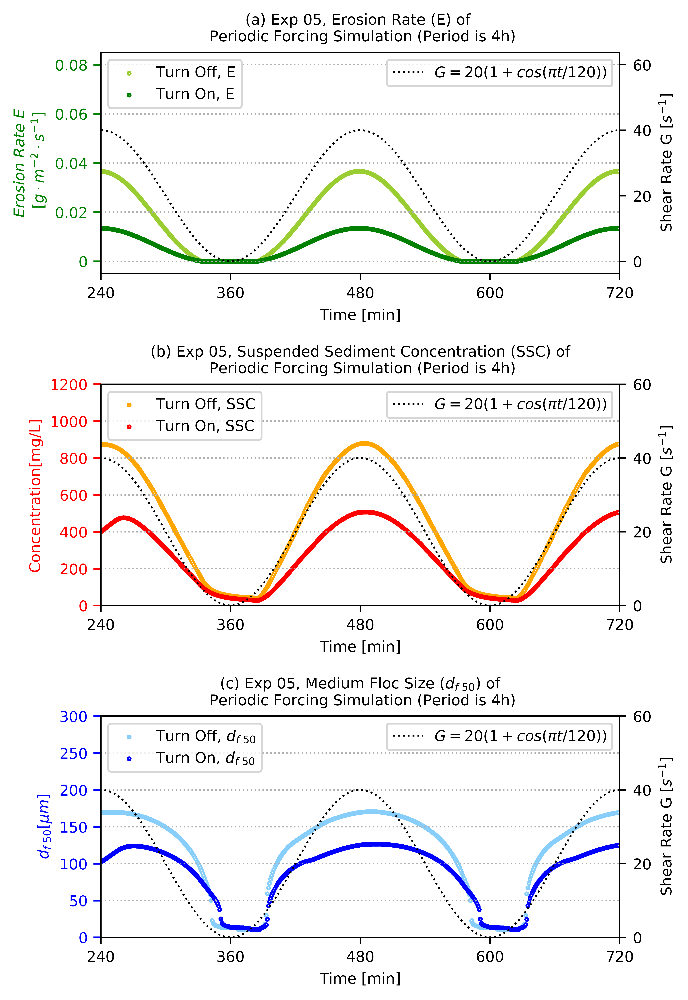

In [16]:
fig = plt.figure(dpi = 1080, figsize = (4*0.75*1+2, 3*0.75*3+2))
plt.subplots_adjust(wspace = 0.5, hspace = 0.5)

gs = GridSpec(3, 1)
ax = fig.add_subplot(gs[0, 0])
bx = fig.add_subplot(gs[1, 0])
cx = fig.add_subplot(gs[2, 0])


X = temp_combine[0,2,::]
Y = temp_combine[1,2,::]
ax_double = ax.twinx()

skip = 1
ax.scatter(np.arange(0, X.shape[0], skip), X[::skip], 
           edgecolors = 'yellowgreen', marker = '.', color = 'white', s = 10, label = 'Turn Off, E')
ax.scatter(np.arange(0, Y.shape[0], skip), Y[::skip], 
           edgecolors = 'green', marker = '.', color = 'white', s = 10, label = 'Turn On, E')
ax.grid(b = True, axis = 'y', linestyle = ':')

ax_double.plot(np.arange(0, X.shape[0], 1), 20*(1+np.cos(np.pi*np.arange(0, X.shape[0])/120)),
               linewidth = 1.0, color = 'black', linestyle = ':', label = '$G = 20(1+cos⁡(\pi t/120))$')

text_size = 8
legend_size = 8
ax.set_title('(a) Exp 05, Erosion Rate (E) of \n Periodic Forcing Simulation (Period is 4h)', fontsize = text_size)

ax.set_xlim(240, 720)
ax.set_xticks([240, 360, 480, 600, 720])
ax.set_xticklabels(['240', '360', '480', '600', '720'])
ax.set_xlabel('Time [min]', fontsize = text_size)
ax.set_ylim(-0.005, 0.085)
ax.set_yticks([0, 0.02, 0.04, 0.06, 0.08])
ax.set_yticklabels(['0','0.02', '0.04', '0.06', '0.08'])
ax.set_ylabel('$Erosion\ Rate\ E$ \n $[g \cdot m^{-2}\cdot s^{-1}]$',color = 'green', fontsize = text_size)
ax.legend(loc = 'upper left', fontsize = legend_size)

ax_double.set_ylim(-60/8/2, 60+60/8/2)
ax_double.set_yticks([0, 20, 40, 60])
ax_double.set_yticklabels(['0', '20', '40', '60'])
ax_double.set_ylabel('Shear Rate G [$s^{-1}$]', fontsize = text_size)
ax_double.legend(loc = 'upper right', fontsize = legend_size)

for label in ax.xaxis.get_ticklabels():
    label.set_color('black')
    label.set_fontsize(text_size)
for label in ax.yaxis.get_ticklabels():
    label.set_color('green')
    label.set_fontsize(text_size)
for label in ax_double.yaxis.get_ticklabels():
    label.set_color('black')
    label.set_fontsize(text_size)

for line in ax.yaxis.get_ticklines():
    line.set_color('green')
    line.set_markersize(4)
    line.set_markeredgewidth(1)
        

X = temp_combine[0,0,::]
Y = temp_combine[1,0,::]
bx_double = bx.twinx()

skip = 1
bx.scatter(np.arange(0, X.shape[0], skip), X[::skip], 
           edgecolors = 'orange', marker = '.', color = 'white', s = 10, label = 'Turn Off, SSC')
bx.scatter(np.arange(0, Y.shape[0], skip), Y[::skip], 
           edgecolors = 'red', marker = '.', color = 'white', s = 10, label = 'Turn On, SSC')
bx.grid(b = True, axis = 'y', linestyle = ':')

bx_double.plot(np.arange(0, X.shape[0], 1), 20*(1+np.cos(np.pi*np.arange(0, X.shape[0])/120)),
               linewidth = 1.0, color = 'black', linestyle = ':', label = '$G = 20(1+cos⁡(\pi t/120))$')

text_size = 8
legend_size = 8
bx.set_title('(b) Exp 05, Suspended Sediment Concentration (SSC) of\n Periodic Forcing Simulation (Period is 4h)', fontsize = text_size)

bx.set_xlim(240, 720)
bx.set_xticks([240, 360, 480, 600, 720])
bx.set_xticklabels(['240', '360', '480', '600', '720'])
bx.set_xlabel('Time [min]', fontsize = text_size)
bx.set_ylim(-0, 1200)
bx.set_yticks([0, 200, 400, 600, 800, 1000, 1200])
bx.set_yticklabels(['0', '200', '400', '600', '800', '1000', '1200'])
bx.set_ylabel('Concentration[mg/L]',color = 'red', fontsize = text_size)
bx.legend(loc = 'upper left', fontsize = legend_size)

bx_double.set_ylim(-0, 60)
bx_double.set_yticks([0, 20, 40, 60])
bx_double.set_yticklabels(['0', '20', '40', '60'])
bx_double.set_ylabel('Shear Rate G [$s^{-1}$]', fontsize = text_size)
bx_double.legend(loc = 'upper right', fontsize = legend_size)

for label in bx.xaxis.get_ticklabels():
    label.set_color('black')
    label.set_fontsize(text_size)
for label in bx.yaxis.get_ticklabels():
    label.set_color('red')
    label.set_fontsize(text_size)
for label in bx_double.yaxis.get_ticklabels():
    label.set_color('black')
    label.set_fontsize(text_size)

for line in bx.yaxis.get_ticklines():
    line.set_color('red')
    line.set_markersize(4)
    line.set_markeredgewidth(1)

    
X = temp_combine[0,1,::]
Y = temp_combine[1,1,::]
cx_double = cx.twinx()

skip = 1
cx.scatter(np.arange(0, X.shape[0], skip), 2*X[::skip], 
           edgecolors = 'lightskyblue', marker = '.', color = 'white', s = 10, label = 'Turn Off, $d_{f\ 50}$')
cx.scatter(np.arange(0, Y.shape[0], skip), 2*Y[::skip], 
           edgecolors = 'blue', marker = '.', color = 'white', s = 10, label = 'Turn On, $d_{f\ 50}$')
cx.grid(b = True, axis = 'y', linestyle = ':')

cx_double.plot(np.arange(0, X.shape[0], 1), 20*(1+np.cos(np.pi*np.arange(0, X.shape[0])/120)),
               linewidth = 1.0, color = 'black', linestyle = ':', label = '$G = 20(1+cos⁡(\pi t/120))$')

text_size = 8
legend_size = 8
cx.set_title('(c) Exp 05, Medium Floc Size $(d_{f\ 50})$ of\n Periodic Forcing Simulation (Period is 4h)', fontsize = text_size)

cx.set_xlim(240, 720)
cx.set_xticks([240, 360, 480, 600, 720])
cx.set_xticklabels(['240', '360', '480', '600', '720'])
cx.set_xlabel('Time [min]', fontsize = text_size)
cx.set_ylim(-0, 300)
cx.set_yticks([0, 50, 100, 150, 200, 250, 300])
cx.set_yticklabels(['0', '50', '100', '150', '200', '250', '300'])
cx.set_ylabel('$d_{f\ 50}[\mu m]$',color = 'blue', fontsize = text_size)
cx.legend(loc = 'upper left', fontsize = legend_size)

cx_double.set_ylim(-0, 60)
cx_double.set_yticks([0, 20, 40, 60])
cx_double.set_yticklabels(['0', '20', '40', '60'])
cx_double.set_ylabel('Shear Rate G [$s^{-1}$]', fontsize = text_size)
cx_double.legend(loc = 'upper right', fontsize = legend_size)

for label in cx.xaxis.get_ticklabels():
    label.set_color('black')
    label.set_fontsize(text_size)
for label in cx.yaxis.get_ticklabels():
    label.set_color('blue')
    label.set_fontsize(text_size)
for label in cx_double.yaxis.get_ticklabels():
    label.set_color('black')
    label.set_fontsize(text_size)

for line in cx.yaxis.get_ticklines():
    line.set_color('blue')
    line.set_markersize(4)
    line.set_markeredgewidth(1)

plt.savefig('./Figure/Tide.jpeg', format = 'jpeg', bbox_inches = 'tight')
plt.savefig('./Figure/Tide.png', format = 'png', bbox_inches = 'tight')
plt.savefig('./Figure/Tide.svg', format = 'svg', bbox_inches = 'tight')
plt.savefig('./Figure/Tide.eps', format = 'eps', bbox_inches = 'tight')

plt.show()

<center> <font color = #82318E size = 3 face = "微软雅黑"> 2.3 Load t0 Data </font> </center>

In [17]:
temp_combine = np.zeros((6,3,720))
temp_combine[0,0:2:,::]=read_data_ssc_df50('TideControl', '129')
temp_combine[1,0:2:,::]=read_data_ssc_df50('t10T12', '129')
temp_combine[2,0:2:,::]=read_data_ssc_df50('t20T12', '129')
temp_combine[3,0:2:,::]=read_data_ssc_df50('t30T12', '129')
temp_combine[4,0:2:,::]=read_data_ssc_df50('t60T12', '129')
temp_combine[5,0:2:,::]=read_data_ssc_df50('t120T12', '129')

temp_combine_bin = np.zeros((6,100,722))
temp_combine_bin[0,::,::]= read_data_bin('TideControl','69')
temp_combine_bin[1,::,::]= read_data_bin('t10T12','69')
temp_combine_bin[2,::,::]= read_data_bin('t20T12','69')
temp_combine_bin[3,::,::]= read_data_bin('t30T12','69')
temp_combine_bin[4,::,::]= read_data_bin('t60T12','69')
temp_combine_bin[5,::,::]= read_data_bin('t120T12','69')

temp_combine[0,2,::] = read_data_ssc_df50('TideControl', '189').reshape(1,720)
temp_combine[1,2,::] = read_data_ssc_df50('t10T12', '189').reshape(1,720)
temp_combine[2,2,::] = read_data_ssc_df50('t20T12', '189').reshape(1,720)
temp_combine[3,2,::] = read_data_ssc_df50('t30T12', '189').reshape(1,720)
temp_combine[4,2,::] = read_data_ssc_df50('t60T12', '189').reshape(1,720)
temp_combine[5,2,::] = read_data_ssc_df50('t120T12', '189').reshape(1,720)

for i in np.arange(1, temp_combine.shape[2], 1):
    temp_combine[0,1,i] = medium_calculate(0,i)
    temp_combine[1,1,i] = medium_calculate(1,i)    
    temp_combine[2,1,i] = medium_calculate(2,i)
    temp_combine[3,1,i] = medium_calculate(3,i)
    temp_combine[4,1,i] = medium_calculate(4,i)
    temp_combine[5,1,i] = medium_calculate(5,i)

1441
<class 'list'>
1440
<class 'numpy.ndarray'>
(2, 720)
----------
1441
<class 'list'>
1440
<class 'numpy.ndarray'>
(2, 720)
----------
1441
<class 'list'>
1440
<class 'numpy.ndarray'>
(2, 720)
----------
1441
<class 'list'>
1440
<class 'numpy.ndarray'>
(2, 720)
----------
1441
<class 'list'>
1440
<class 'numpy.ndarray'>
(2, 720)
----------
1441
<class 'list'>
1440
<class 'numpy.ndarray'>
(2, 720)
----------
72201
<class 'list'>
72200
<class 'numpy.ndarray'>
(100, 722)
----------
72201
<class 'list'>
72200
<class 'numpy.ndarray'>
(100, 722)
----------
72201
<class 'list'>
72200
<class 'numpy.ndarray'>
(100, 722)
----------
72201
<class 'list'>
72200
<class 'numpy.ndarray'>
(100, 722)
----------
72201
<class 'list'>
72200
<class 'numpy.ndarray'>
(100, 722)
----------
72201
<class 'list'>
72200
<class 'numpy.ndarray'>
(100, 722)
----------
721
<class 'list'>
720
<class 'numpy.ndarray'>
(2, 360)
----------
721
<class 'list'>
720
<class 'numpy.ndarray'>
(2, 360)
----------
721
<class 'li

<center> <font color = #82318E size = 3 face = "微软雅黑"> 2.4 Draw </font> </center>

In [18]:
def Resuspension_Rate(ax, experiment_id, title):
    X = temp_combine[0,2,::]
    Y = temp_combine[experiment_id,2,::]
    ax_double = ax.twinx()
    
    print('Control Group Maximum: {}; Minutes: {}'.format(np.max(temp_combine[0,2,:120:]), np.argmax(temp_combine[0,2,:120:])))
    print('Parameterization Maximum: {}; Minutes: {}'.format(np.max(temp_combine[experiment_id,2,:120:]), np.argmax(temp_combine[experiment_id,2,:120:])))

    skip = 1
    ax.scatter(np.arange(0, X.shape[0], skip), X[::skip], 
               edgecolors = 'yellowgreen', marker = '.', color = 'white', s = 10, label = 'Turn Off, E')
    ax.scatter(np.arange(0, Y.shape[0], skip), Y[::skip], 
               edgecolors = 'green', marker = '.', color = 'white', s = 10, label = 'Turn On, E')
    ax.grid(b = True, axis = 'y', linestyle = ':')

    ax_double.plot(np.arange(0, X.shape[0], 1), 20*(1+np.cos(np.pi*np.arange(0, X.shape[0])/120)),
                   linewidth = 1.0, color = 'black', linestyle = ':', label = '$G = 20(1+cos⁡(\pi t/120))$')

    legend_size = 6
    ax.set_title('(a{}) {}, E'.format(experiment_id, title), fontsize = text_size)

    ax.set_xlim(0, 480)
    ax.set_xticks([0, 120, 240, 360, 480])
    ax.set_xticklabels(['0', '120', '240', '360', '480'])
    ax.set_xlabel('Time [min]', fontsize = text_size)
    ax.set_ylim(-0.005, 0.085)
    ax.set_yticks([0, 0.02, 0.04, 0.06, 0.08])
    ax.set_yticklabels(['0','0.02', '0.04', '0.06', '0.08'])
    ax.set_ylabel('$Erosion\ Rate\ E$ \n $[g \cdot m^{-2}\cdot s^{-1}]$',color = 'green', fontsize = text_size)
    ax.legend(loc = legend_loc, fontsize = legend_size)

    ax_double.set_ylim(-60/8/2, 60+60/8/2)
    ax_double.set_yticks([0, 20, 40, 60])
    ax_double.set_yticklabels(['0', '20', '40', '60'])
    ax_double.set_ylabel('Shear Rate G [$s^{-1}$]', fontsize = text_size)
    ax_double.legend(loc = loc_legend, fontsize = legend_size)

    for label in ax.xaxis.get_ticklabels():
        label.set_color('black')
        label.set_fontsize(text_size)
    for label in ax.yaxis.get_ticklabels():
        label.set_color('green')
        label.set_fontsize(text_size)
    for label in ax_double.yaxis.get_ticklabels():
        label.set_color('black')
        label.set_fontsize(text_size)

    for line in ax.yaxis.get_ticklines():
        line.set_color('green')
        line.set_markersize(4)
        line.set_markeredgewidth(1)
    return
    

def Suspended_Sediment_Concentration(bx, experiment_id, title):
    X = temp_combine[0,0,::]
    Y = temp_combine[experiment_id,0,::]
    bx_double = bx.twinx()
          
    print('Control Group Maximum: {}; Minutes: {}'.format(np.max(temp_combine[0,0,:120:]), np.argmax(temp_combine[0,0,:120:])))
    print('Parameterization Maximum: {}; Minutes: {}'.format(np.max(temp_combine[experiment_id,0,:120:]), np.argmax(temp_combine[experiment_id,0,:120:])))

    skip = 1
    bx.scatter(np.arange(0, X.shape[0], skip), X[::skip], 
               edgecolors = 'orange', marker = '.', color = 'white', s = 10, label = 'Turn Off, SSC')
    bx.scatter(np.arange(0, Y.shape[0], skip), Y[::skip], 
               edgecolors = 'red', marker = '.', color = 'white', s = 10, label = 'Turn On, SSC')
    bx.grid(b = True, axis = 'y', linestyle = ':')

    bx_double.plot(np.arange(0, X.shape[0], 1), 20*(1+np.cos(np.pi*np.arange(0, X.shape[0])/120)),
                   linewidth = 1.0, color = 'black', linestyle = ':', label = '$G = 20(1+cos⁡(\pi t/120))$')

    legend_size = 6
    bx.set_title('(b{}) {}, SSC'.format(experiment_id, title), fontsize = text_size)

    bx.set_xlim(0, 480)
    bx.set_xticks([0, 120, 240, 360, 480])
    bx.set_xticklabels(['0', '120', '240', '360', '480'])
    bx.set_xlabel('Time [min]', fontsize = text_size)
    bx.set_ylim(-0, 1500)
    bx.set_yticks([0, 500, 1000, 1500])
    bx.set_yticklabels(['0', '500', '1000', '1500'])
    bx.set_ylabel('Concentration[mg/L]',color = 'red', fontsize = text_size)
    bx.legend(loc = legend_loc, fontsize = legend_size)

    bx_double.set_ylim(-0, 60)
    bx_double.set_yticks([0, 20, 40, 60])
    bx_double.set_yticklabels(['0', '20', '40', '60'])
    bx_double.set_ylabel('Shear Rate G [$s^{-1}$]', fontsize = text_size)
    bx_double.legend(loc = loc_legend, fontsize = legend_size)

    for label in bx.xaxis.get_ticklabels():
        label.set_color('black')
        label.set_fontsize(text_size)
    for label in bx.yaxis.get_ticklabels():
        label.set_color('red')
        label.set_fontsize(text_size)
    for label in bx_double.yaxis.get_ticklabels():
        label.set_color('black')
        label.set_fontsize(text_size)

    for line in bx.yaxis.get_ticklines():
        line.set_color('red')
        line.set_markersize(4)
        line.set_markeredgewidth(1)
    return


def Medium_Floc_Size(cx, experiment_id, title):
    X = temp_combine[0,1,::]
    Y = temp_combine[experiment_id,1,::]
    cx_double = cx.twinx()

    print('Control Group Maximum: {}; Minutes: {}'.format(np.max(temp_combine[0,1,:120:]), np.argmax(temp_combine[0,1,:120:])))
    print('Parameterization Maximum: {}; Minutes: {}'.format(np.max(temp_combine[experiment_id,1,:120:]), np.argmax(temp_combine[experiment_id,1,:120:])))
          
    skip = 1
    cx.scatter(np.arange(0, X.shape[0], skip), 2*X[::skip], 
               edgecolors = 'lightskyblue', marker = '.', color = 'white', s = 10, label = 'Turn Off, $d_{f\ 50}$')
    cx.scatter(np.arange(0, Y.shape[0], skip), 2*Y[::skip], 
               edgecolors = 'blue', marker = '.', color = 'white', s = 10, label = 'Turn On, $d_{f\ 50}$')
    cx.grid(b = True, axis = 'y', linestyle = ':')

    cx_double.plot(np.arange(0, X.shape[0], 1), 20*(1+np.cos(np.pi*np.arange(0, X.shape[0])/120)),
                   linewidth = 1.0, color = 'black', linestyle = ':', label = '$G = 20(1+cos⁡(\pi t/120))$')

    legend_size = 6
    cx.set_title('(c{}) {}, df50'.format(experiment_id, title), fontsize = text_size)

    cx.set_xlim(0, 480)
    cx.set_xticks([0, 120, 240, 360, 480])
    cx.set_xticklabels(['0', '120', '240', '360', '480'])
    cx.set_xlabel('Time [min]', fontsize = text_size)
    cx.set_ylim(-0, 300)
    cx.set_yticks([0, 50, 100, 150, 200, 250, 300])
    cx.set_yticklabels(['0', '50', '100', '150', '200', '250', '300'])
    cx.set_ylabel('$d_{f\ 50}[\mu m]$',color = 'blue', fontsize = text_size)
    cx.legend(loc = legend_loc, fontsize = legend_size)

    cx_double.set_ylim(-0, 60)
    cx_double.set_yticks([0, 20, 40, 60])
    cx_double.set_yticklabels(['0', '20', '40', '60'])
    cx_double.set_ylabel('Shear Rate G [$s^{-1}$]', fontsize = text_size)
    cx_double.legend(loc = loc_legend, fontsize = legend_size)

    for label in cx.xaxis.get_ticklabels():
        label.set_color('black')
        label.set_fontsize(text_size)
    for label in cx.yaxis.get_ticklabels():
        label.set_color('blue')
        label.set_fontsize(text_size)
    for label in cx_double.yaxis.get_ticklabels():
        label.set_color('black')
        label.set_fontsize(text_size)

    for line in cx.yaxis.get_ticklines():
        line.set_color('blue')
        line.set_markersize(4)
        line.set_markeredgewidth(1)
    return 

In [19]:
fig = plt.figure(dpi = 1080, figsize = (4*0.75*3+2, 3*0.75*5+2))
plt.subplots_adjust(wspace = 0.5, hspace = 0.5)
legend_loc = (0.02, 0.78)
loc_legend = (0.02, 0.68)

gs = GridSpec(5, 3)
ax = list(); bx = list(); cx = list()

ax.append(fig.add_subplot(gs[0, 0]))
bx.append(fig.add_subplot(gs[0, 1]))
cx.append(fig.add_subplot(gs[0, 2]))
ax.append(fig.add_subplot(gs[1, 0]))
bx.append(fig.add_subplot(gs[1, 1]))
cx.append(fig.add_subplot(gs[1, 2]))
ax.append(fig.add_subplot(gs[2, 0]))
bx.append(fig.add_subplot(gs[2, 1]))
cx.append(fig.add_subplot(gs[2, 2]))
ax.append(fig.add_subplot(gs[3, 0]))
bx.append(fig.add_subplot(gs[3, 1]))
cx.append(fig.add_subplot(gs[3, 2]))
ax.append(fig.add_subplot(gs[4, 0]))
bx.append(fig.add_subplot(gs[4, 1]))
cx.append(fig.add_subplot(gs[4, 2]))

Resuspension_Rate(ax[0], 1, 'Exp 06 ($t_0$=10mins, $T_0$=12.0days)')
Suspended_Sediment_Concentration(bx[0], 1, 'Exp 06 ($t_0$=10mins, $T_0$=12.0days)')
Medium_Floc_Size(cx[0], 1, 'Exp 06 ($t_0$=10mins, $T_0$=12.0days)')

Resuspension_Rate(ax[1], 2, 'Exp 07 ($t_0$=20mins, $T_0$=12.0days)')
Suspended_Sediment_Concentration(bx[1], 2, 'Exp 07 ($t_0$=20mins, $T_0$=12.0days)')
Medium_Floc_Size(cx[1], 2, 'Exp 07 ($t_0$=20mins, $T_0$=12.0days)')

Resuspension_Rate(ax[2], 3, 'Exp 05 ($t_0$=30mins, $T_0$=12.0days)')
Suspended_Sediment_Concentration(bx[2], 3, 'Exp 05 ($t_0$=30mins, $T_0$=12.0days)')
Medium_Floc_Size(cx[2], 3, 'Exp 05 ($t_0$=30mins, $T_0$=12.0days)')

Resuspension_Rate(ax[3], 4, 'Exp 08 ($t_0$=60mins, $T_0$=12.0days)')
Suspended_Sediment_Concentration(bx[3], 4, 'Exp 08 ($t_0$=60mins, $T_0$=12.0days)')
Medium_Floc_Size(cx[3], 4, 'Exp 08 ($t_0$=60mins, $T_0$=12.0days)')

Resuspension_Rate(ax[4], 5, 'Exp 09 ($t_0$=120mins, $T_0$=12.0days)')
Suspended_Sediment_Concentration(bx[4], 5, 'Exp 09 ($t_0$=120mins, $T_0$=12.0days)')
Medium_Floc_Size(cx[4], 5, 'Exp 09 ($t_0$=120mins, $T_0$=12.0days)')

plt.savefig('./Figure/t0.10to120.jpeg', format = 'jpeg', bbox_inches = 'tight')
plt.savefig('./Figure/t0.10to120.png', format = 'png', bbox_inches = 'tight')
plt.savefig('./Figure/t0.10to120.svg', format = 'svg', bbox_inches = 'tight')
plt.savefig('./Figure/t0.10to120.eps', format = 'eps', bbox_inches = 'tight')

plt.show()

Control Group Maximum: 0.036655; Minutes: 0
Parameterization Maximum: 0.010787; Minutes: 20
Control Group Maximum: 548.11; Minutes: 55
Parameterization Maximum: 200.12; Minutes: 82
Control Group Maximum: 70.43930187512593; Minutes: 63
Parameterization Maximum: 23.040268424646314; Minutes: 90
Control Group Maximum: 0.036655; Minutes: 0
Parameterization Maximum: 0.0089967; Minutes: 23
Control Group Maximum: 548.11; Minutes: 55
Parameterization Maximum: 178.28; Minutes: 85
Control Group Maximum: 70.43930187512593; Minutes: 63
Parameterization Maximum: 19.111564671264144; Minutes: 92
Control Group Maximum: 0.036655; Minutes: 0
Parameterization Maximum: 0.0080923; Minutes: 21
Control Group Maximum: 548.11; Minutes: 55
Parameterization Maximum: 163.58; Minutes: 86
Control Group Maximum: 70.43930187512593; Minutes: 63
Parameterization Maximum: 17.1804671589721; Minutes: 93
Control Group Maximum: 0.036655; Minutes: 0
Parameterization Maximum: 0.0071794; Minutes: 14
Control Group Maximum: 548.1

<center> <font color = #82318E size = 3 face = "微软雅黑"> 2.5 Load T0 Data </font> </center>

In [20]:
temp_combine = np.zeros((6,3,720))
temp_combine[0,0:2:,::]=read_data_ssc_df50('TideControl', '129')
temp_combine[1,0:2:,::]=read_data_ssc_df50('t30T6', '129')
temp_combine[2,0:2:,::]=read_data_ssc_df50('t30T9', '129')
temp_combine[3,0:2:,::]=read_data_ssc_df50('t30T12', '129')
temp_combine[4,0:2:,::]=read_data_ssc_df50('t30T15', '129')
temp_combine[5,0:2:,::]=read_data_ssc_df50('t30T18', '129')

temp_combine_bin = np.zeros((6,100,722))
temp_combine_bin[0,::,::]= read_data_bin('TideControl','69')
temp_combine_bin[1,::,::]= read_data_bin('t30T6','69')
temp_combine_bin[2,::,::]= read_data_bin('t30T9','69')
temp_combine_bin[3,::,::]= read_data_bin('t30T12','69')
temp_combine_bin[4,::,::]= read_data_bin('t30T15','69')
temp_combine_bin[5,::,::]= read_data_bin('t30T18','69')

temp_combine[0,2,::] = read_data_ssc_df50('TideControl', '189').reshape(1,720)
temp_combine[1,2,::] = read_data_ssc_df50('t30T6', '189').reshape(1,720)
temp_combine[2,2,::] = read_data_ssc_df50('t30T9', '189').reshape(1,720)
temp_combine[3,2,::] = read_data_ssc_df50('t30T12', '189').reshape(1,720)
temp_combine[4,2,::] = read_data_ssc_df50('t30T15', '189').reshape(1,720)
temp_combine[5,2,::] = read_data_ssc_df50('t30T18', '189').reshape(1,720)

for i in np.arange(1, temp_combine.shape[2], 1):
    temp_combine[0,1,i] = medium_calculate(0,i)
    temp_combine[1,1,i] = medium_calculate(1,i)    
    temp_combine[2,1,i] = medium_calculate(2,i)
    temp_combine[3,1,i] = medium_calculate(3,i)
    temp_combine[4,1,i] = medium_calculate(4,i)
    temp_combine[5,1,i] = medium_calculate(5,i)

1441
<class 'list'>
1440
<class 'numpy.ndarray'>
(2, 720)
----------
1441
<class 'list'>
1440
<class 'numpy.ndarray'>
(2, 720)
----------
1441
<class 'list'>
1440
<class 'numpy.ndarray'>
(2, 720)
----------
1441
<class 'list'>
1440
<class 'numpy.ndarray'>
(2, 720)
----------
1441
<class 'list'>
1440
<class 'numpy.ndarray'>
(2, 720)
----------
1441
<class 'list'>
1440
<class 'numpy.ndarray'>
(2, 720)
----------
72201
<class 'list'>
72200
<class 'numpy.ndarray'>
(100, 722)
----------
72201
<class 'list'>
72200
<class 'numpy.ndarray'>
(100, 722)
----------
72201
<class 'list'>
72200
<class 'numpy.ndarray'>
(100, 722)
----------
72201
<class 'list'>
72200
<class 'numpy.ndarray'>
(100, 722)
----------
72201
<class 'list'>
72200
<class 'numpy.ndarray'>
(100, 722)
----------
72201
<class 'list'>
72200
<class 'numpy.ndarray'>
(100, 722)
----------
721
<class 'list'>
720
<class 'numpy.ndarray'>
(2, 360)
----------
721
<class 'list'>
720
<class 'numpy.ndarray'>
(2, 360)
----------
721
<class 'li

<center> <font color = #82318E size = 3 face = "微软雅黑"> 2.6 Draw </font> </center>

In [21]:
def Resuspension_Rate(ax, experiment_id, title):
    X = temp_combine[0,2,::]
    Y = temp_combine[experiment_id,2,::]
    ax_double = ax.twinx()
    
    print('Control Group Maximum: {}'.format(np.max(temp_combine[0,2,::])))
    print('Parameterization Maximum: {}'.format(np.max(temp_combine[experiment_id,2,::])))

    skip = 1
    ax.scatter(np.arange(0, X.shape[0], skip), X[::skip], 
               edgecolors = 'yellowgreen', marker = '.', color = 'white', s = 10, label = 'Turn Off, E')
    ax.scatter(np.arange(0, Y.shape[0], skip), Y[::skip], 
               edgecolors = 'green', marker = '.', color = 'white', s = 10, label = 'Turn On, E')
    ax.grid(b = True, axis = 'y', linestyle = ':')

    ax_double.plot(np.arange(0, X.shape[0], 1), 20*(1+np.cos(np.pi*np.arange(0, X.shape[0])/120)),
                   linewidth = 1.0, color = 'black', linestyle = ':', label = '$G = 20(1+cos⁡(\pi t/120))$')

    legend_size = 6
    ax.set_title('(a{}) {}, E'.format(experiment_id, title), fontsize = text_size)

    ax.set_xlim(240, 720)
    ax.set_xticks([240, 360, 480, 600, 720])
    ax.set_xticklabels(['240', '360', '480', '600', '720'])
    ax.set_xlabel('Time [min]', fontsize = text_size)
    ax.set_ylim(-0.005, 0.085)
    ax.set_yticks([0, 0.02, 0.04, 0.06, 0.08])
    ax.set_yticklabels(['0','0.02', '0.04', '0.06', '0.08'])
    ax.set_ylabel('$Erosion\ Rate\ E$ \n $[g \cdot m^{-2}\cdot s^{-1}]$',color = 'green', fontsize = text_size)
    ax.legend(loc = legend_loc, fontsize = legend_size)

    ax_double.set_ylim(-60/8/2, 60+60/8/2)
    ax_double.set_yticks([0, 20, 40, 60])
    ax_double.set_yticklabels(['0', '20', '40', '60'])
    ax_double.set_ylabel('Shear Rate G [$s^{-1}$]', fontsize = text_size)
    ax_double.legend(loc = loc_legend, fontsize = legend_size)

    for label in ax.xaxis.get_ticklabels():
        label.set_color('black')
        label.set_fontsize(text_size)
    for label in ax.yaxis.get_ticklabels():
        label.set_color('green')
        label.set_fontsize(text_size)
    for label in ax_double.yaxis.get_ticklabels():
        label.set_color('black')
        label.set_fontsize(text_size)

    for line in ax.yaxis.get_ticklines():
        line.set_color('green')
        line.set_markersize(4)
        line.set_markeredgewidth(1)
    return
    

def Suspended_Sediment_Concentration(bx, experiment_id, title):
    X = temp_combine[0,0,::]
    Y = temp_combine[experiment_id,0,::]
    bx_double = bx.twinx()
          
    print('Control Group Maximum: {}'.format(np.max(temp_combine[0,0,::])))
    print('Parameterization Maximum: {}'.format(np.max(temp_combine[experiment_id,0,::])))

    skip = 1
    bx.scatter(np.arange(0, X.shape[0], skip), X[::skip], 
               edgecolors = 'orange', marker = '.', color = 'white', s = 10, label = 'Turn Off, SSC')
    bx.scatter(np.arange(0, Y.shape[0], skip), Y[::skip], 
               edgecolors = 'red', marker = '.', color = 'white', s = 10, label = 'Turn On, SSC')
    bx.grid(b = True, axis = 'y', linestyle = ':')

    bx_double.plot(np.arange(0, X.shape[0], 1), 20*(1+np.cos(np.pi*np.arange(0, X.shape[0])/120)),
                   linewidth = 1.0, color = 'black', linestyle = ':', label = '$G = 20(1+cos⁡(\pi t/120))$')

    legend_size = 6
    bx.set_title('(b{}) {}, SSC'.format(experiment_id, title), fontsize = text_size)

    bx.set_xlim(240, 720)
    bx.set_xticks([240, 360, 480, 600, 720])
    bx.set_xticklabels(['240', '360', '480', '600', '720'])
    bx.set_xlabel('Time [min]', fontsize = text_size)
    bx.set_ylim(-0, 1500)
    bx.set_yticks([0, 500, 1000, 1500])
    bx.set_yticklabels(['0', '500', '1000', '1500'])
    bx.set_ylabel('Concentration[mg/L]',color = 'red', fontsize = text_size)
    bx.legend(loc = legend_loc, fontsize = legend_size)

    bx_double.set_ylim(-0, 60)
    bx_double.set_yticks([0, 20, 40, 60])
    bx_double.set_yticklabels(['0', '20', '40', '60'])
    bx_double.set_ylabel('Shear Rate G [$s^{-1}$]', fontsize = text_size)
    bx_double.legend(loc = loc_legend, fontsize = legend_size)

    for label in bx.xaxis.get_ticklabels():
        label.set_color('black')
        label.set_fontsize(text_size)
    for label in bx.yaxis.get_ticklabels():
        label.set_color('red')
        label.set_fontsize(text_size)
    for label in bx_double.yaxis.get_ticklabels():
        label.set_color('black')
        label.set_fontsize(text_size)

    for line in bx.yaxis.get_ticklines():
        line.set_color('red')
        line.set_markersize(4)
        line.set_markeredgewidth(1)
    return


def Medium_Floc_Size(cx, experiment_id, title):
    X = temp_combine[0,1,::]
    Y = temp_combine[experiment_id,1,::]
    cx_double = cx.twinx()

    print('Control Group Maximum: {}'.format(np.max(temp_combine[0,1,::])))
    print('Parameterization Maximum: {}'.format(np.max(temp_combine[experiment_id,1,::])))
          
    skip = 1
    cx.scatter(np.arange(0, X.shape[0], skip), 2*X[::skip], 
               edgecolors = 'lightskyblue', marker = '.', color = 'white', s = 10, label = 'Turn Off, $d_{f\ 50}$')
    cx.scatter(np.arange(0, Y.shape[0], skip), 2*Y[::skip], 
               edgecolors = 'blue', marker = '.', color = 'white', s = 10, label = 'Turn On, $d_{f\ 50}$')
    cx.grid(b = True, axis = 'y', linestyle = ':')

    cx_double.plot(np.arange(0, X.shape[0], 1), 20*(1+np.cos(np.pi*np.arange(0, X.shape[0])/120)),
                   linewidth = 1.0, color = 'black', linestyle = ':', label = '$G = 20(1+cos⁡(\pi t/120))$')

    legend_size = 6
    cx.set_title('(c{}) {}, df50'.format(experiment_id, title), fontsize = text_size)
    
    cx.set_xlim(240, 720)
    cx.set_xticks([240, 360, 480, 600, 720])
    cx.set_xticklabels(['240', '360', '480', '600', '720'])
    cx.set_xlabel('Time [min]', fontsize = text_size)
    cx.set_ylim(-0, 300)
    cx.set_yticks([0, 50, 100, 150, 200, 250, 300])
    cx.set_yticklabels(['0', '50', '100', '150', '200', '250', '300'])
    cx.set_ylabel('$d_{f\ 50}[\mu m]$',color = 'blue', fontsize = text_size)
    cx.legend(loc = legend_loc, fontsize = legend_size)

    cx_double.set_ylim(-0, 60)
    cx_double.set_yticks([0, 20, 40, 60])
    cx_double.set_yticklabels(['0', '20', '40', '60'])
    cx_double.set_ylabel('Shear Rate G [$s^{-1}$]', fontsize = text_size)
    cx_double.legend(loc = loc_legend, fontsize = legend_size)

    for label in cx.xaxis.get_ticklabels():
        label.set_color('black')
        label.set_fontsize(text_size)
    for label in cx.yaxis.get_ticklabels():
        label.set_color('blue')
        label.set_fontsize(text_size)
    for label in cx_double.yaxis.get_ticklabels():
        label.set_color('black')
        label.set_fontsize(text_size)

    for line in cx.yaxis.get_ticklines():
        line.set_color('blue')
        line.set_markersize(4)
        line.set_markeredgewidth(1)
    return 

In [22]:
fig = plt.figure(dpi = 1080, figsize = (4*0.75*3+2, 3*0.75*5+2))
plt.subplots_adjust(wspace = 0.5, hspace = 0.5)
legend_loc = (0.02, 0.78)
loc_legend = (0.02, 0.68)

gs = GridSpec(5, 3)
ax = list(); bx = list(); cx = list()

ax.append(fig.add_subplot(gs[0, 0]))
bx.append(fig.add_subplot(gs[0, 1]))
cx.append(fig.add_subplot(gs[0, 2]))
ax.append(fig.add_subplot(gs[1, 0]))
bx.append(fig.add_subplot(gs[1, 1]))
cx.append(fig.add_subplot(gs[1, 2]))
ax.append(fig.add_subplot(gs[2, 0]))
bx.append(fig.add_subplot(gs[2, 1]))
cx.append(fig.add_subplot(gs[2, 2]))
ax.append(fig.add_subplot(gs[3, 0]))
bx.append(fig.add_subplot(gs[3, 1]))
cx.append(fig.add_subplot(gs[3, 2]))
ax.append(fig.add_subplot(gs[4, 0]))
bx.append(fig.add_subplot(gs[4, 1]))
cx.append(fig.add_subplot(gs[4, 2]))

Resuspension_Rate(ax[0], 1, 'Exp 10 ($t_0$=30mins, $T_0$=6.0days)')
Suspended_Sediment_Concentration(bx[0], 1, 'Exp 10 ($t_0$=30mins, $T_0$=6.0days)')
Medium_Floc_Size(cx[0], 1, 'Exp 10 ($t_0$=30mins, $T_0$=6.0days)')

Resuspension_Rate(ax[1], 2, 'Exp 11 ($t_0$=30mins, $T_0$=9.0days)')
Suspended_Sediment_Concentration(bx[1], 2, 'Exp 11 ($t_0$=30mins, $T_0$=9.0days)')
Medium_Floc_Size(cx[1], 2, 'Exp 11 ($t_0$=30mins, $T_0$=9.0days)')

Resuspension_Rate(ax[2], 3, 'Exp 05 ($t_0$=30mins, $T_0$=12.0days)')
Suspended_Sediment_Concentration(bx[2], 3, 'Exp 05 ($t_0$=30mins, $T_0$=12.0days)')
Medium_Floc_Size(cx[2], 3, 'Exp 05 ($t_0$=30mins, $T_0$=12.0days)')

Resuspension_Rate(ax[3], 4, 'Exp 12 ($t_0$=30mins, $T_0$=15.0days)')
Suspended_Sediment_Concentration(bx[3], 4, 'Exp 12 ($t_0$=30mins, $T_0$=15.0days)')
Medium_Floc_Size(cx[3], 4, 'Exp 12 ($t_0$=30mins, $T_0$=15.0days)')

Resuspension_Rate(ax[4], 5, 'Exp 13 ($t_0$=30mins, $T_0$=18.0days)')
Suspended_Sediment_Concentration(bx[4], 5, 'Exp 13 ($t_0$=30mins, $T_0$=18.0days)')
Medium_Floc_Size(cx[4], 5, 'Exp 13 ($t_0$=30mins, $T_0$=18.0days)')

plt.savefig('./Figure/T0.6to18.jpeg', format = 'jpeg', bbox_inches = 'tight')
plt.savefig('./Figure/T0.6to18.png', format = 'png', bbox_inches = 'tight')
plt.savefig('./Figure/T0.6to18.svg', format = 'svg', bbox_inches = 'tight')
plt.savefig('./Figure/T0.6to18.eps', format = 'eps', bbox_inches = 'tight')

plt.show()

Control Group Maximum: 0.036664
Parameterization Maximum: 0.004962
Control Group Maximum: 879.51
Parameterization Maximum: 287.93
Control Group Maximum: 85.23675210063972
Parameterization Maximum: 46.86635441908989
Control Group Maximum: 0.036664
Parameterization Maximum: 0.0096646
Control Group Maximum: 879.51
Parameterization Maximum: 422.53
Control Group Maximum: 85.23675210063972
Parameterization Maximum: 57.390931682719454
Control Group Maximum: 0.036664
Parameterization Maximum: 0.013488
Control Group Maximum: 879.51
Parameterization Maximum: 506.98
Control Group Maximum: 85.23675210063972
Parameterization Maximum: 63.256020836503986
Control Group Maximum: 0.036664
Parameterization Maximum: 0.016474
Control Group Maximum: 879.51
Parameterization Maximum: 567.57
Control Group Maximum: 85.23675210063972
Parameterization Maximum: 67.24411698818167
Control Group Maximum: 0.036664
Parameterization Maximum: 0.018824
Control Group Maximum: 879.51
Parameterization Maximum: 607.99
Control